# Processing Images for OCR

In [34]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from pathlib import Path

## 0. Opening the Image

In [35]:
data_dir = Path('.') / "data"
image_fp = data_dir / "table_01.jpg"
# Load the image into memory
img = cv2.imread(filename=str(image_fp))

In [36]:
# https://stackoverflow.com/questions/28816046/displaying-different-images-with-actual-size-in-matplotlib-subplot
# I want to display the images in Jupyter Notebook without opening a new window
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

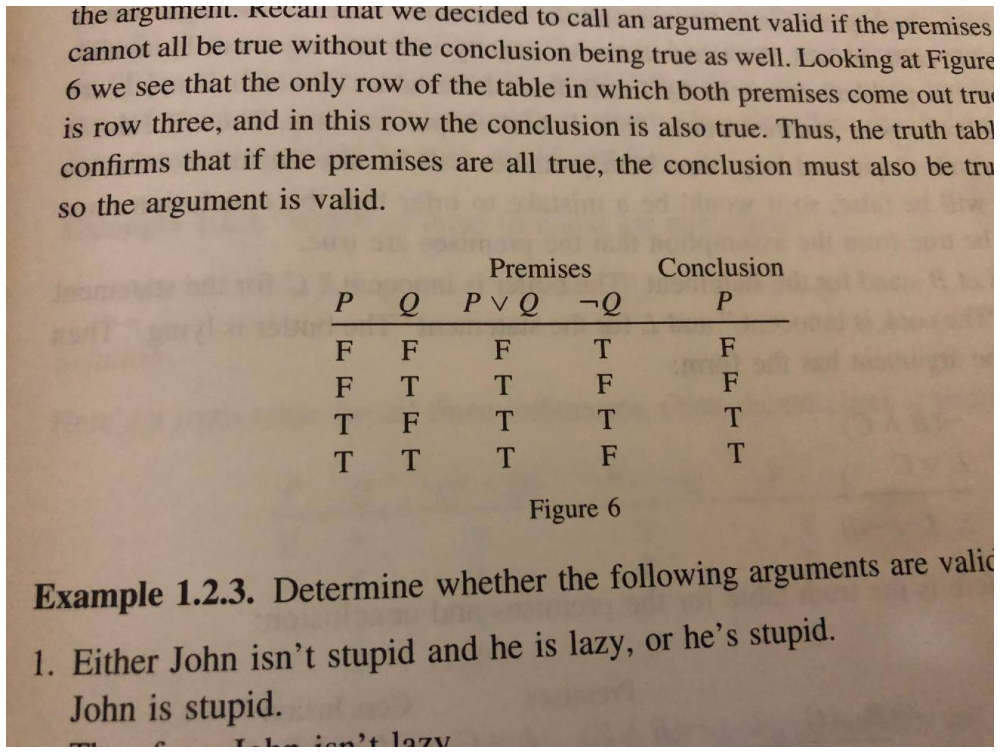

In [37]:
display(image_fp)

## 1. Inverted Images

In [38]:
# Inverting makes light areas darker and dark areas lighter

inverted_image = cv2.bitwise_not(img)
temp_dir = Path('.') / "temp"
inverted_fp = temp_dir / "inverted.jpg"
cv2.imwrite(
    filename=str(inverted_fp),
    img=inverted_image
)

True

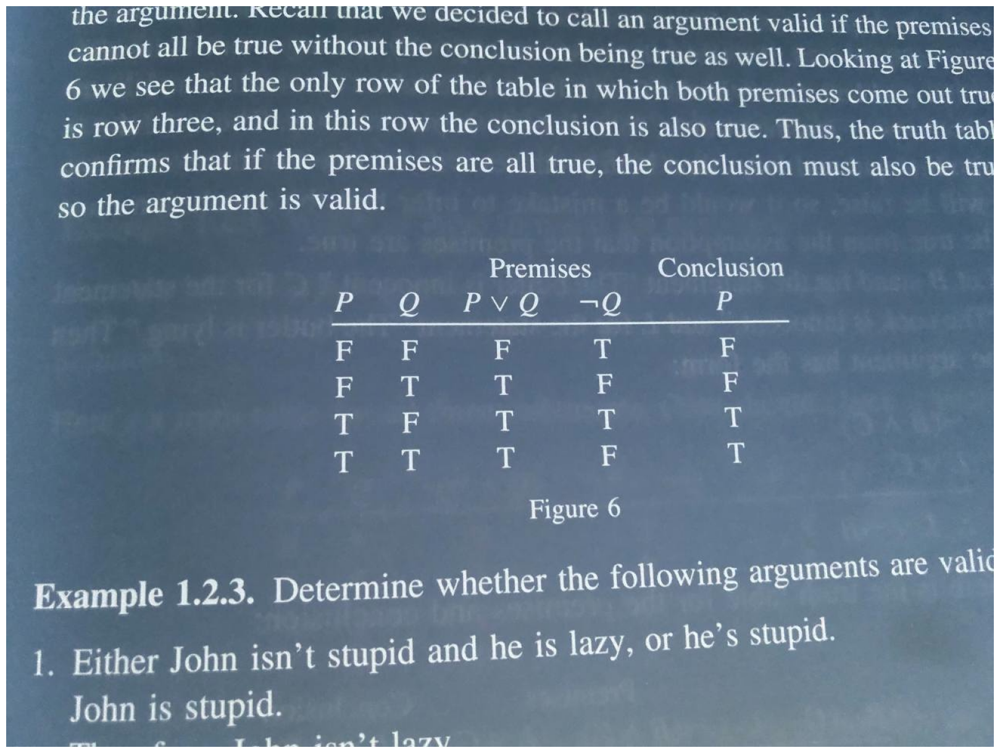

In [39]:
display(inverted_fp)

## 2. Rescaling

## 3. Binarisation

In [40]:
# Convert an image to Black and White
# Before converting, the image has to be grayscale

def grayscale(image):
    return cv2.cvtColor(
        src=image,
        code=cv2.COLOR_BGR2GRAY
    )

In [41]:
grayscaled_image = grayscale(img)
grayscale_fp = temp_dir / "grayscale.jpg"
cv2.imwrite(
    filename=str(grayscale_fp),
    img=grayscaled_image
)

True

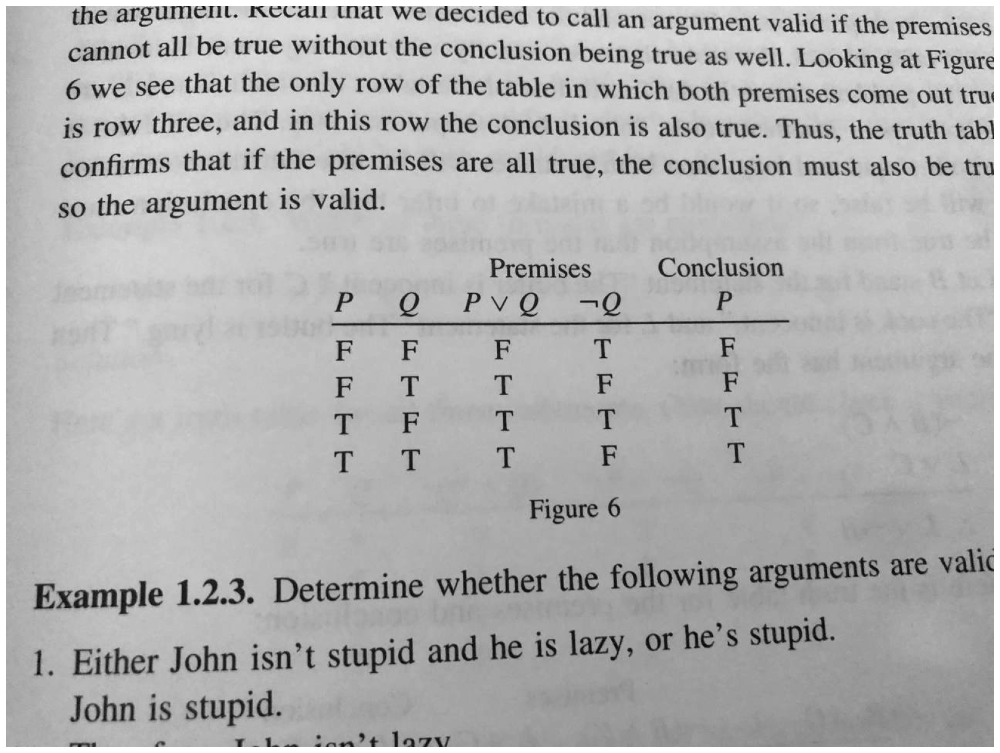

In [42]:
display(grayscale_fp)

In [43]:
thresh, im_bw = cv2.threshold(
    src=grayscaled_image,
    thresh=100,
    maxval=150,
    type=cv2.THRESH_BINARY
)
bw_fp = temp_dir / "bw_image.jpg"
cv2.imwrite(
    filename=str(bw_fp),
    img=im_bw
)

True

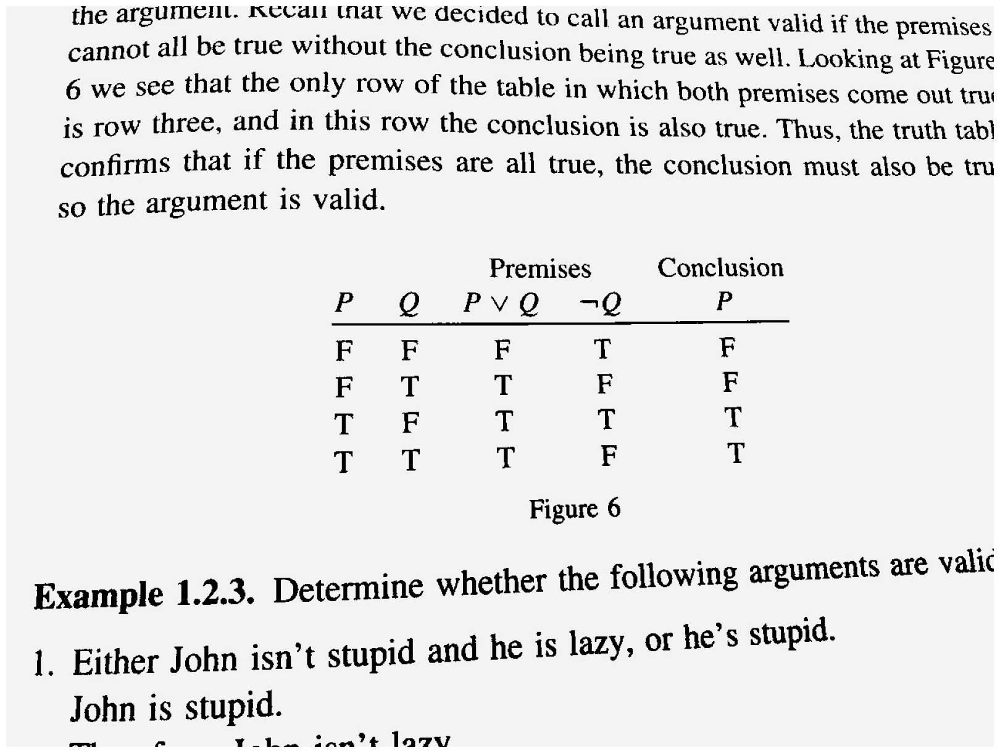

In [44]:
display(bw_fp)

## 4. Noise Removal

In [45]:
def rm_noise(image):
    # Dilate the image
    kernel = np.ones(
        shape=(1, 1),
        dtype=np.uint8
    )

    image = cv2.dilate(
        src=image,
        kernel=kernel,
        iterations=1
    )
    # Reuse the same kernel for simplicity
    # Erode the image
    kernel = np.ones(
        shape=(1, 1),
        dtype=np.uint8
    )

    image = cv2.erode(
        src=image,
        kernel=kernel,
        iterations=1
    )

    # Morph the image
    image = cv2.morphologyEx(
        src=image,
        op=cv2.MORPH_CLOSE,
        kernel=kernel
    )

    # Blur the image a little
    image = cv2.medianBlur(
        src=image,
        ksize=3
    )

    return image

In [46]:
no_noise = rm_noise(im_bw)
no_noise_fp = temp_dir / "no_noise.jpg"
cv2.imwrite(
    filename=str(no_noise_fp),
    img=no_noise
)

True

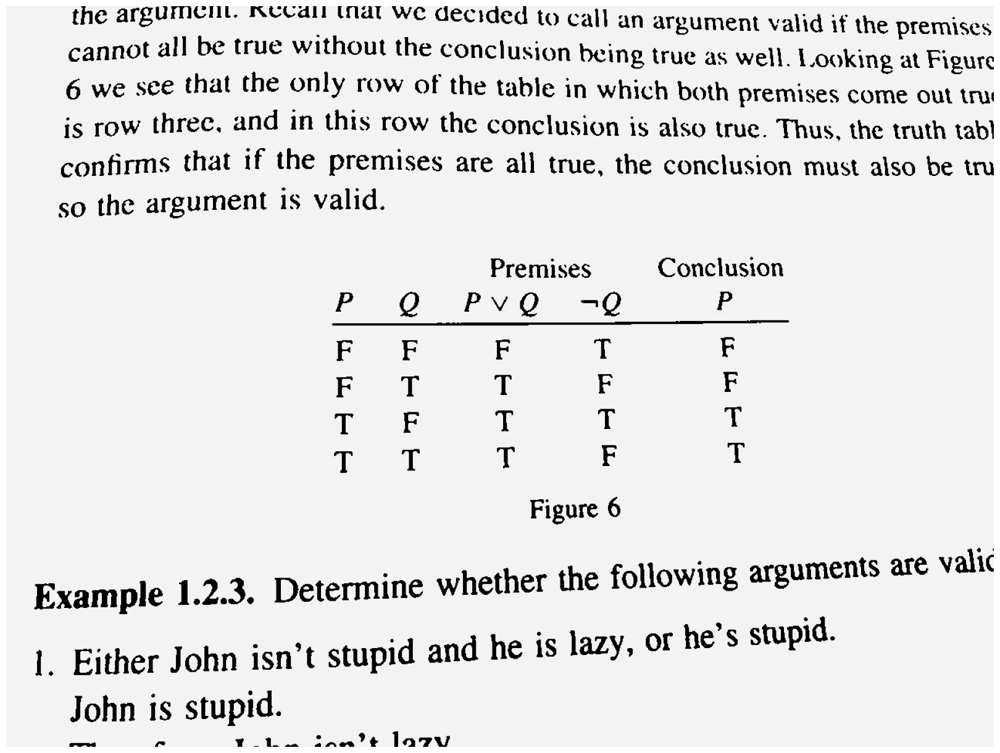

In [47]:
display(no_noise_fp)

## 5. Dilation and Erosion

In [48]:
# There is no noise here but we want to adjust the font (thicken/thin)

def thin_font(image):
    image = cv2.bitwise_not(img)

    kernel = np.ones(
        shape=(2, 2),
        dtype=np.uint8
    )

    image = cv2.erode(
        src=image,
        kernel=kernel,
        iterations=1
    )

    image = cv2.bitwise_not(image)
    
    return image

In [49]:
eroded_image = thin_font(no_noise)
eroded_fp = temp_dir / "eroded.jpg"
cv2.imwrite(
    filename=str(eroded_fp),
    img=eroded_image
)

True

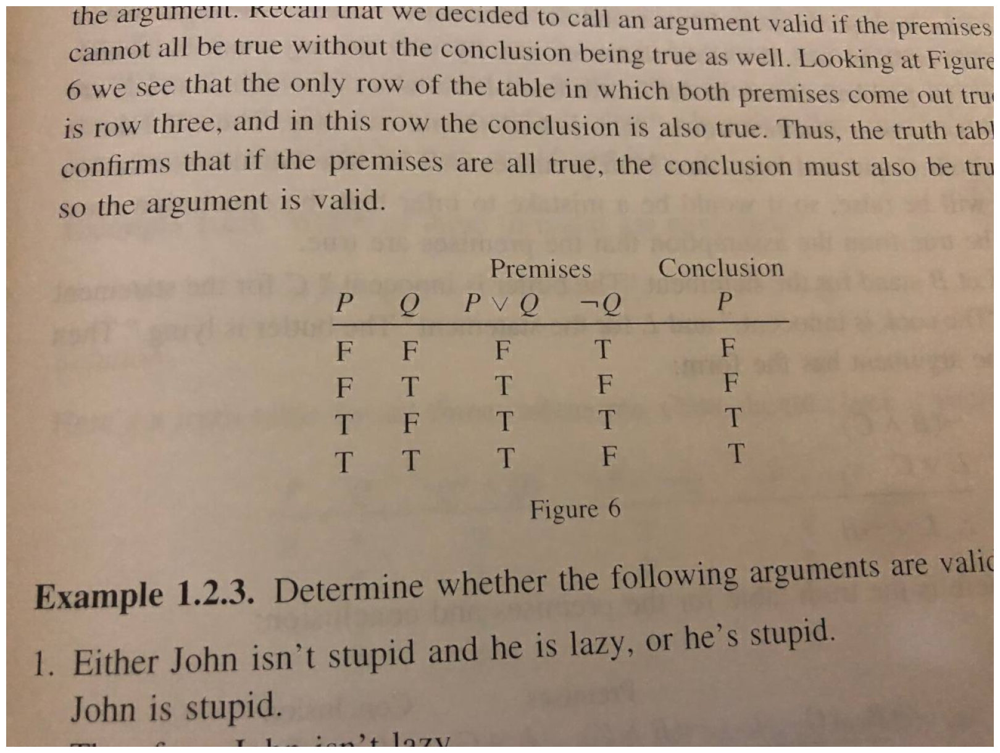

In [50]:
display(eroded_fp)

In [51]:
def thick_font(image):
    image = cv2.bitwise_not(img)

    kernel = np.ones(
        shape=(2, 2),
        dtype=np.uint8
    )

    image = cv2.dilate(
        src=image,
        kernel=kernel,
        iterations=1
    )

    image = cv2.bitwise_not(image)
    
    return image

In [52]:
dilated_image = thick_font(no_noise)
dilated_fp = temp_dir / "dilated.jpg"
cv2.imwrite(
    filename=str(dilated_fp),
    img=dilated_image
)

True

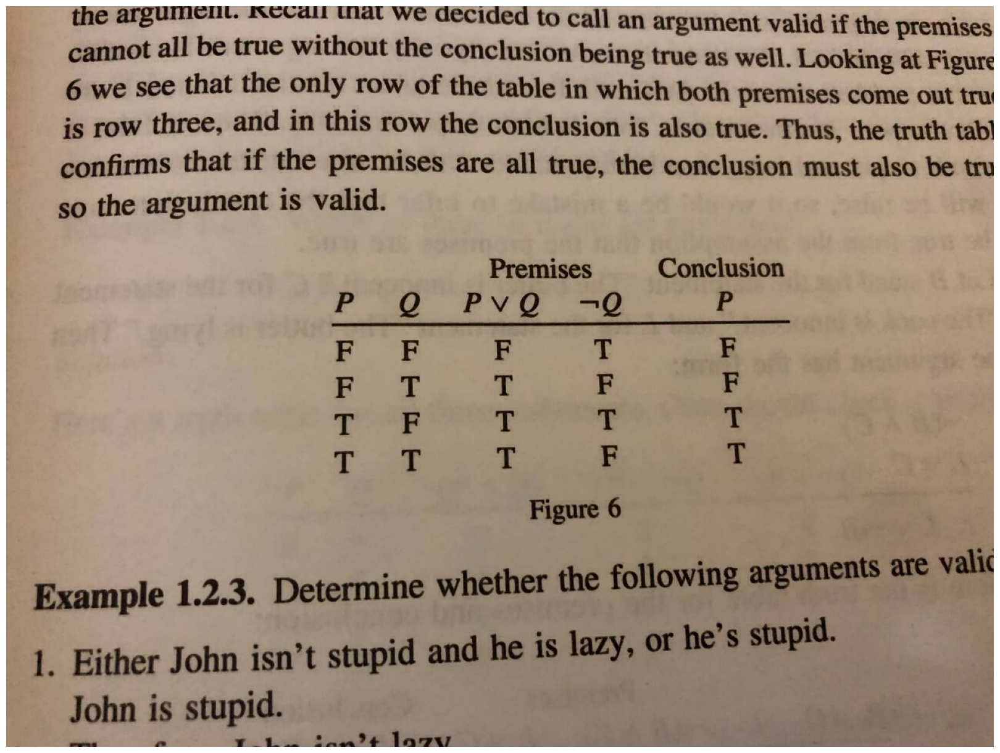

In [53]:
display(dilated_fp)

## 6. Rotation/Deskewing

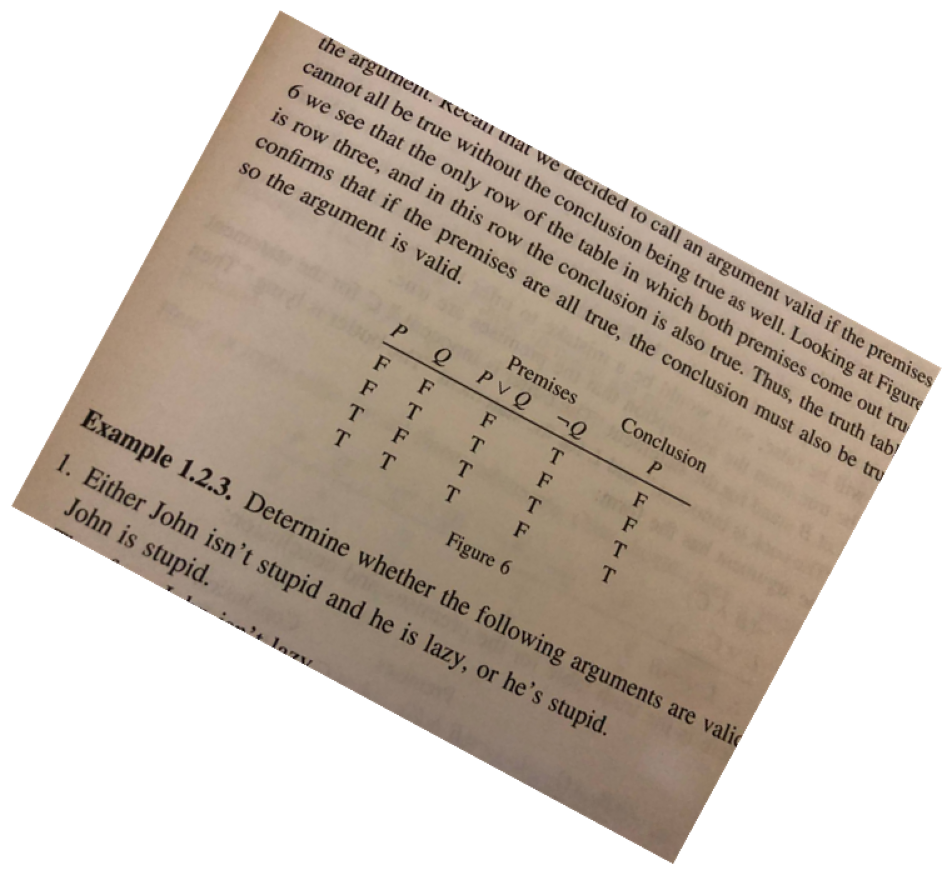

In [54]:
input_rotated_fp = data_dir / "table_01_rotated.png"
input_rotated_image = cv2.imread(
    filename=str(input_rotated_fp)
)
display(input_rotated_fp)

In [55]:
# https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle

# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [56]:
fixed_image = deskew(input_rotated_image)
fixed_fp = temp_dir / "rotated_fixed.png"
cv2.imwrite(
    filename=str(fixed_fp),
    img=fixed_image
)


1


True

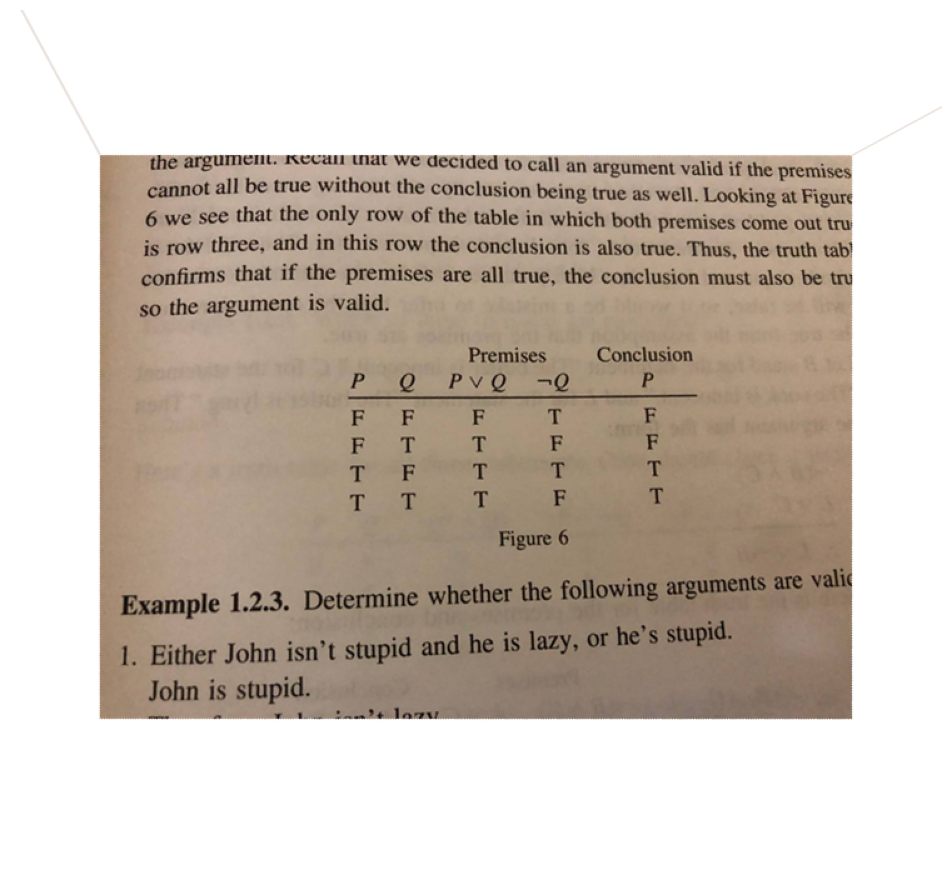

In [57]:
display(fixed_fp)

## 7. Removing Borders

In [58]:
# Borders should be removed before rotating/deskewing

def remove_borders(image):
    contours, hierarchy = cv2.findContours(
        image=image,
        mode=cv2.RETR_EXTERNAL,
        method=cv2.CHAIN_APPROX_SIMPLE
    )

    sorted_contours = sorted(
        contours,
        key=lambda x: cv2.contourArea(x)
    )

    cnt = sorted_contours[-1]

    x, y, w, h = cv2.boundingRect(cnt)

    crop = image[y:y+h, x:x+w]

    return crop

In [59]:
no_borders = remove_borders(no_noise)
no_borders_fp = temp_dir / "no_borders.png"
cv2.imwrite(
    filename=str(no_borders_fp),
    img=no_borders
)

True

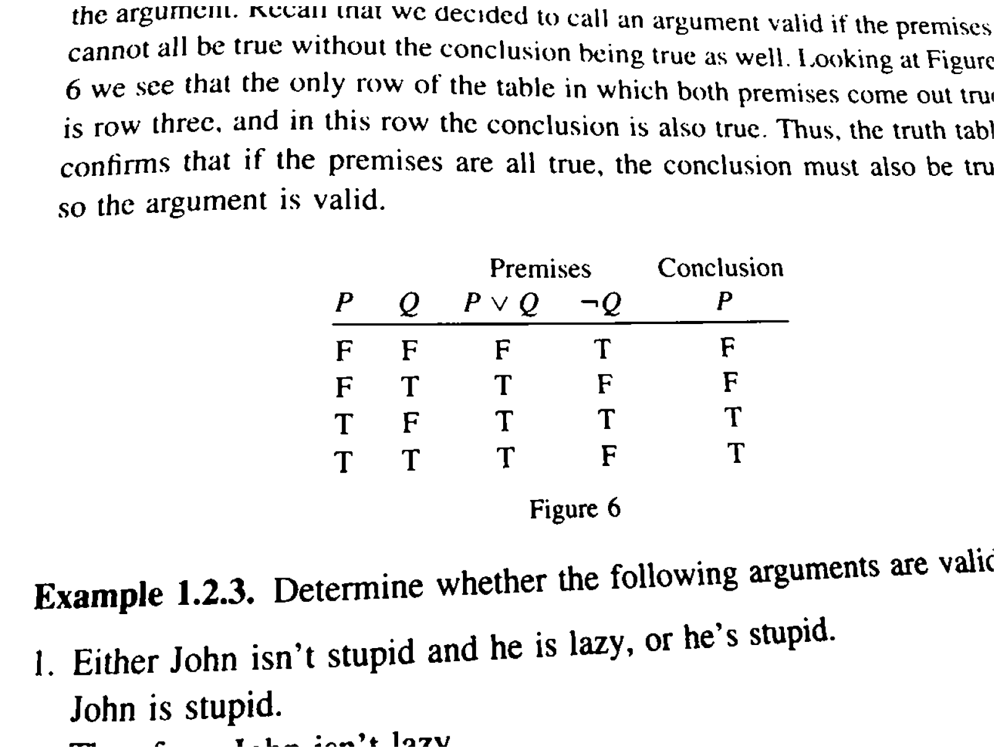

In [60]:
display(no_borders_fp)

## 8. Missing Borders

In [61]:
border_color = [255, 255, 255]
# create width of 150 for all sides
top, bottom, left, right = [150]*4

In [62]:
image_with_border = cv2.copyMakeBorder(
    src=no_borders,
    top=top, bottom=bottom,left=left,right=right,
    borderType=cv2.BORDER_CONSTANT,
    value=border_color
)
image_with_border_fp = temp_dir / "image_with_border.png"
cv2.imwrite(
    filename=str(image_with_border_fp),
    img=image_with_border
)

True

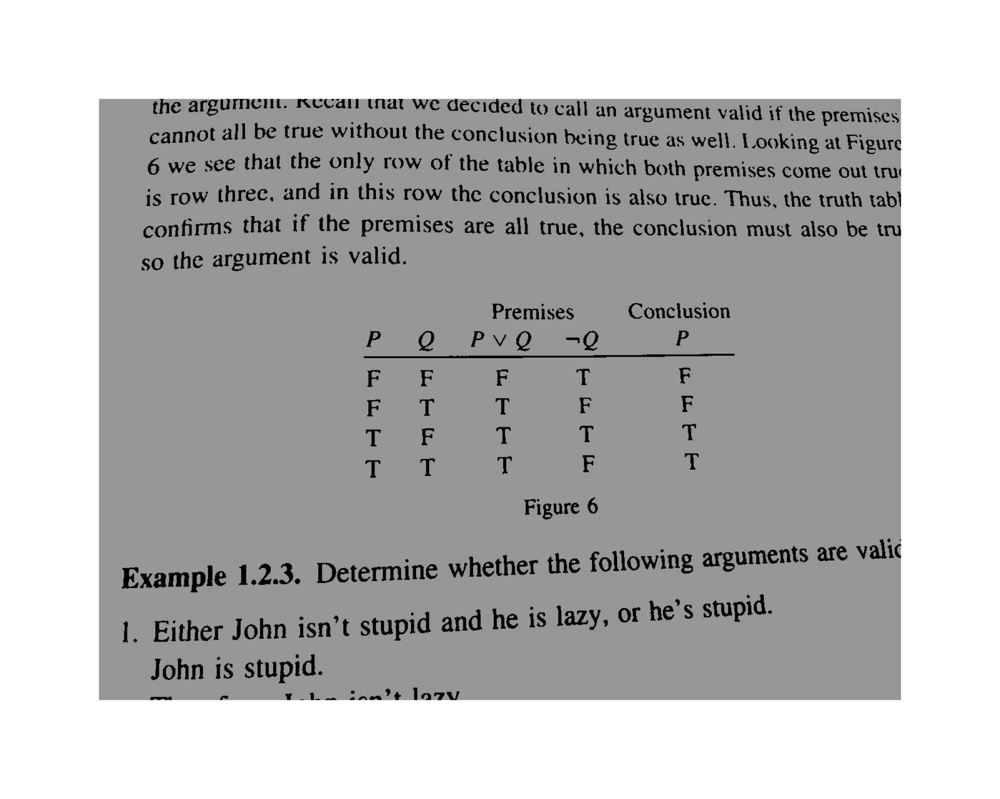

In [63]:
display(image_with_border_fp)